# Análisis Exploratorio y Curación de Datos

**Todo ejercicio debe tener un análisis fundamentado en la teoría vista en la materia, dicho análisis sera parte del informe a entregar en pdf**

El *dataset* contiene las siguientes columnas:

- **rac y dec** = Posición angular, rac de 0 a 360 y dec de -90 a 90
- **Mag_u,Mag_g,Mag_r,Mag_i,Mag_z**= Estas variables representan una fracción de la luz total que observamos de las galaxias según su frecuencia (como por ejemplo, la frecuencia de radio, para más información [wiki](https://es.wikipedia.org/wiki/Espectro_visible))
- **z** = Es una medida de la distancia a la que se encuentra la galaxia
- **R** = Es una medida del tamaño de la galaxia
- **color**= Como su nombre lo indica es el color más predominante en la galaxia
- **elíptica, espiral, irregular**= Estas columnas identifican el tipo de morfología de las galaxias. Si el valor de una de estas tres columnas es 1, entonces la galaxia tiene esa morfología y las dos restantes tendran el valor 0. 

# Paquetes necesarios 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
 
%matplotlib inline

In [2]:
plt.rcParams['figure.figsize'] = (10.0, 8.0)


# Carga de datos

Carga el conjunto de datos 'galaxias_1.csv' como un DataFrame 

- Definir el id como index del DataFrame
- Mostrar el tipo de dato de cada columna 
- Observar si hay filas e indices duplicados
- Realicen algunas exploraciones más sobre el dataset
- Estudiar y solucionar los outliers o valores faltantes 

In [3]:
data = pd.read_csv("dataset/galaxias_1.csv")
data.head()

,objID,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
0,"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0
1,"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1
2,"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1
3,"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1
4,"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1


In [4]:
data.describe()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
count,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000
mean,181.086338,24.723737,184.319135,171.045909,160.125000,163.614406,139.806936,57.032318,0.036092,-3.462711,0.089651,0.326225,0.584124
std,61.177151,18.853785,1737.511731,1612.598539,1525.504087,1530.181510,1402.492646,923.367743,0.008435,76.781199,0.285682,0.468833,0.492875
min,0.008745,-11.202394,-9999.000000,-9999.000000,11.524090,11.220580,-9999.000000,0.842248,0.020001,-2902.000000,0.000000,0.000000,0.000000
25%,150.287271,9.115292,17.733585,16.260870,15.572525,15.210220,14.919152,6.120165,0.029082,-2.511168,0.000000,0.000000,0.000000
50%,183.219954,23.111344,18.453880,17.094630,16.506160,16.188085,15.947850,8.365595,0.036321,-1.995331,0.000000,0.000000,1.000000
75%,222.722975,38.982500,19.047078,17.734885,17.227810,16.947265,16.753538,11.368645,0.043620,-1.607067,0.000000,1.000000,1.000000
max,359.965567,70.133213,25756.000000,20542.000000,19138.000000,23871.000000,20823.000000,78255.000000,0.050000,10015.860000,1.000000,1.000000,1.000000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92102 entries, 0 to 92101
Data columns (total 14 columns):
objID         92102 non-null object
ra            92102 non-null float64
dec           92102 non-null float64
modelMag_u    92102 non-null float64
modelMag_g    92102 non-null float64
modelMag_r    92102 non-null float64
modelMag_i    92102 non-null float64
modelMag_z    92102 non-null float64
petroR90_r    92102 non-null float64
z             92102 non-null float64
Color         92102 non-null float64
elliptical    92102 non-null int64
spiral        92102 non-null int64
uncertain     92102 non-null int64
dtypes: float64(10), int64(3), object(1)
memory usage: 9.8+ MB


Seteo "objID" como index

In [6]:
data.set_index("objID", inplace=True)

In [7]:
data.head()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
objID,,,,,,,,,,,,,
"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0
"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1
"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1
"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1
"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1


Veo que tipos de datos tengo

In [8]:
data.dtypes

ra            float64
dec           float64
modelMag_u    float64
modelMag_g    float64
modelMag_r    float64
modelMag_i    float64
modelMag_z    float64
petroR90_r    float64
z             float64
Color         float64
elliptical      int64
spiral          int64
uncertain       int64
dtype: object

## Veo si tengo valores duplicados

In [70]:
data[data.astype(str).duplicated()].shape

(61, 13)

In [9]:
data[data.index.astype(str).duplicated()].shape[0] / data.shape[0]

0.37372695489783064

In [71]:
data[data.index.astype(str).duplicated()].shape[0]

34421

### Saco los duplicados

In [90]:
data.shape

(92102, 13)

In [11]:
data_cl = data.loc[~(data.index.astype(str).duplicated(keep="first"))]

In [12]:
data_cl.shape

(57681, 13)

In [13]:
data_cl.head()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
objID,,,,,,,,,,,,,
"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0
"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1
"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1
"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1
"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1


In [14]:
data_cl[data_cl.index.astype(str).duplicated(keep="first")]

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
objID,,,,,,,,,,,,,


Hago un poco más de exploración en el data set

In [15]:
def galaxy_morf(row):
    if row["elliptical"]:
        return "E"
    elif row["spiral"]:
        return "S"
    else:
        return "I"

In [16]:
data_cl["type"] = data_cl.apply(galaxy_morf, axis=1)

/home/franco/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


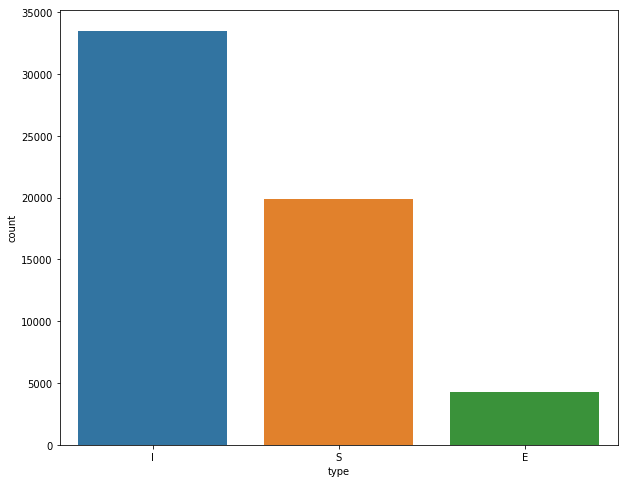

In [17]:
sns.countplot(data_cl["type"], order=["I", "S", "E"])

## Veo valores faltantes

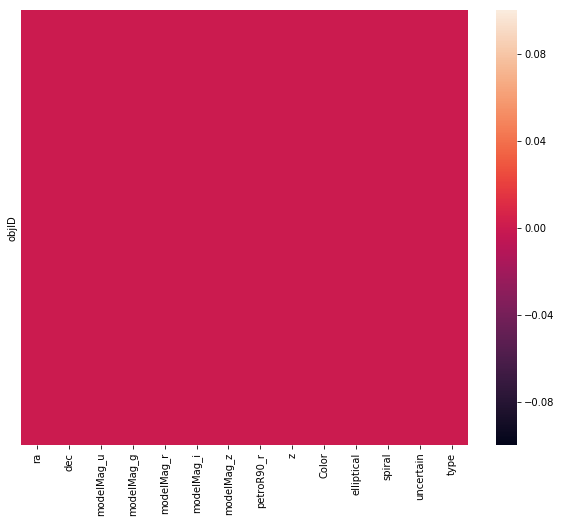

In [18]:
sns.heatmap(data_cl.isna(), yticklabels=False)

No tengo valores NaN. Pero puede que tenga valores que fisicamente no tienen sentido

## Distribucion de datos

In [19]:
def distribution_per_type(df, col_name="", bins=20):
    plt.title(f"{col_name.capitalize()} Distribution")
    sns.distplot(df[df["elliptical"] == 1][col_name],label="elliptical", bins=bins)
    sns.distplot(df[df["spiral"] == 1][col_name],label="spiral", bins=bins)
    sns.distplot(df[df["uncertain"] == 1][col_name],label="irregular", bins=bins)
    plt.legend()
    
def exploratory_plots(df, col_name=""):
    plt.subplot(3, 1, 1)
    distribution_per_type(df, col_name)
    plt.subplot(3, 1, 2)
    plt.title(f"{col_name.capitalize()} Boxplot")
    sns.boxplot(x="type", y=col_name, data=df)

    plt.subplot(3, 1, 3)
    plt.title(f"{col_name.capitalize()} Boxplot w/o Outliers")
    sns.boxplot(x="type", y=col_name, data=df, showfliers=False)
    
    plt.tight_layout()

### Z (red shift)

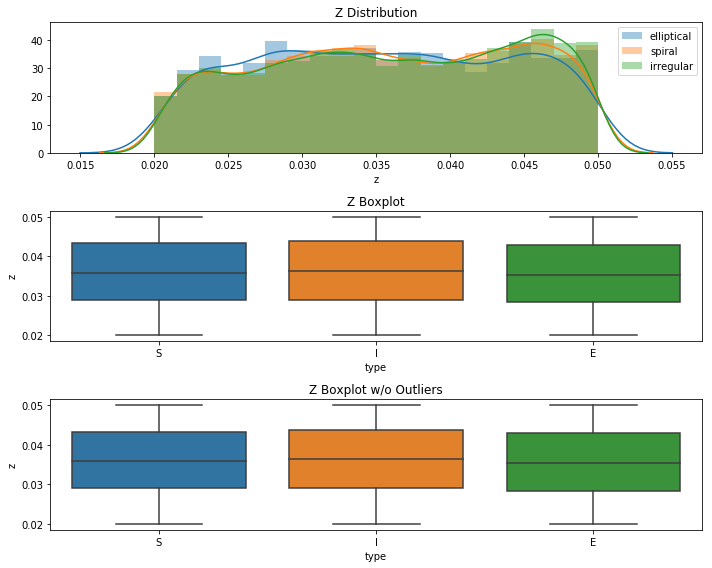

In [20]:
exploratory_plots(data_cl, "z")

_____________________
La columna "z", tiene una ditribcuion uniforme y no parece tener outliers
_____________________

### Color

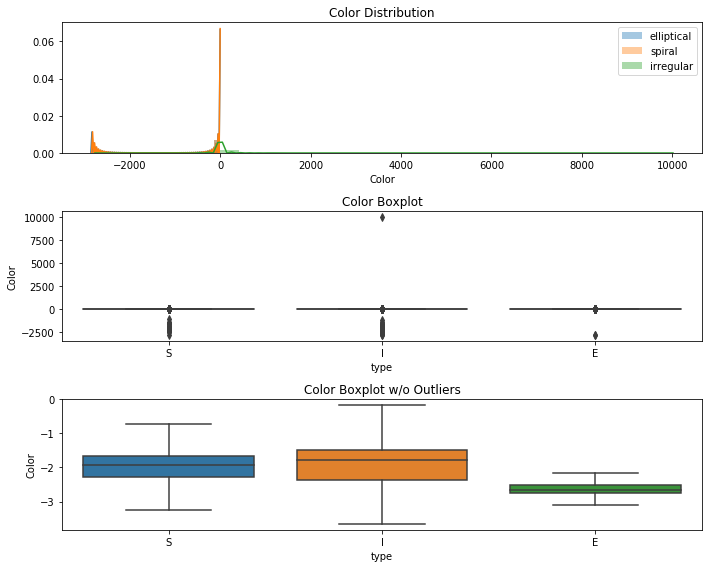

In [21]:
exploratory_plots(data_cl, "Color")

Vemos que hay valores muy extremos, mientras que gran parte de la distribucion esta en valores alrededor de 0

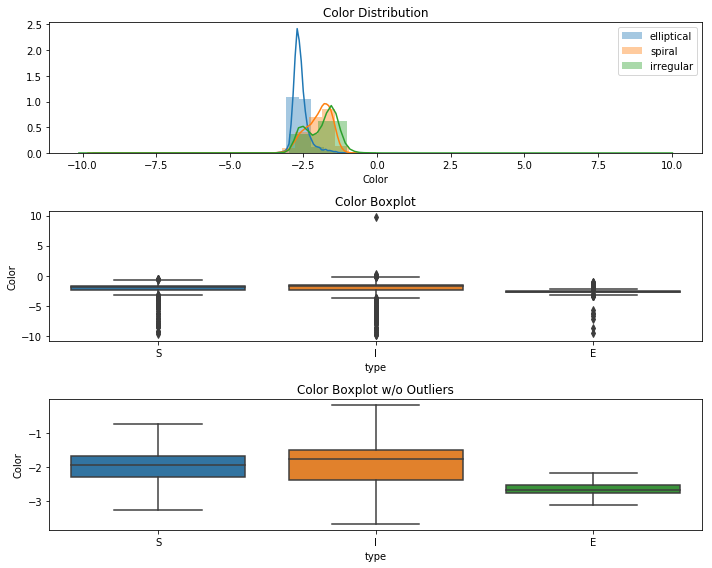

In [22]:
mask_color = (data_cl["Color"] < 10) & (data_cl["Color"]>-10)
exploratory_plots(data_cl[mask_color], "Color")


Podemos decir que los datos de color que tienen sentido deben estar entre 0 y -5

In [23]:
mask_color = (data_cl["Color"] < 0) & (data_cl["Color"]>-5)
data_cl_color = data_cl[mask_color]

In [24]:
print(data_cl.shape)
print(data_cl_color.shape)

(57681, 14)
(57506, 14)


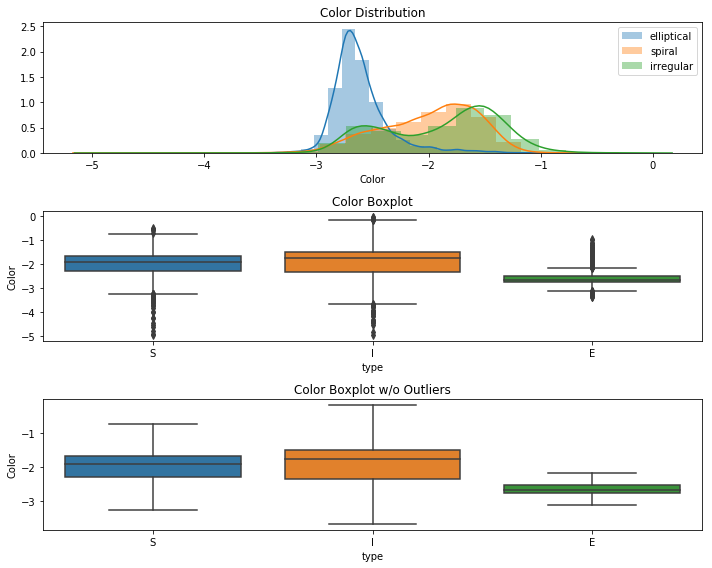

In [25]:
exploratory_plots(data_cl_color, "Color")

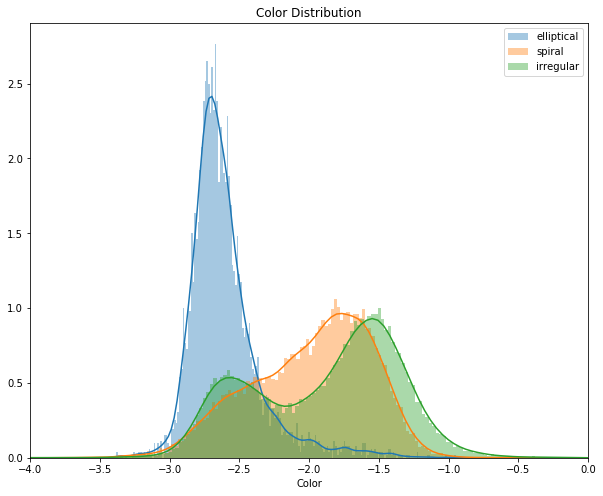

In [26]:
distribution_per_type(data_cl_color, col_name="Color", bins=200)
_ = plt.xlim([-4, 0])

### petroR90_r

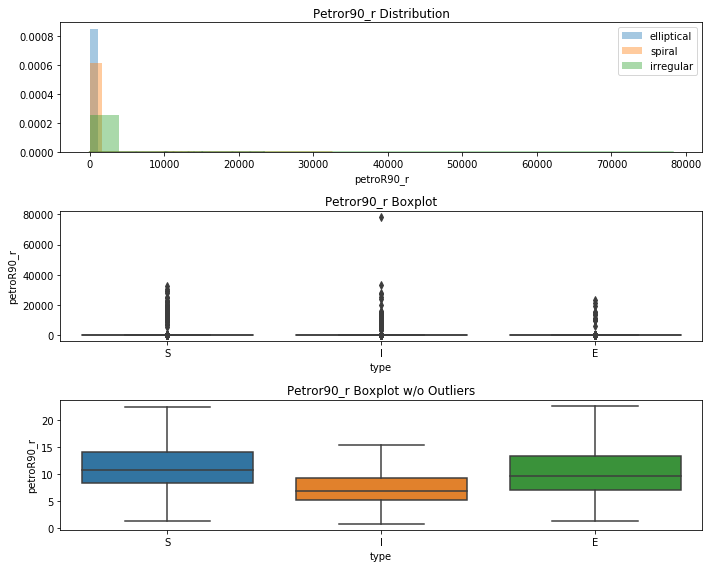

In [27]:
exploratory_plots(data_cl, "petroR90_r")

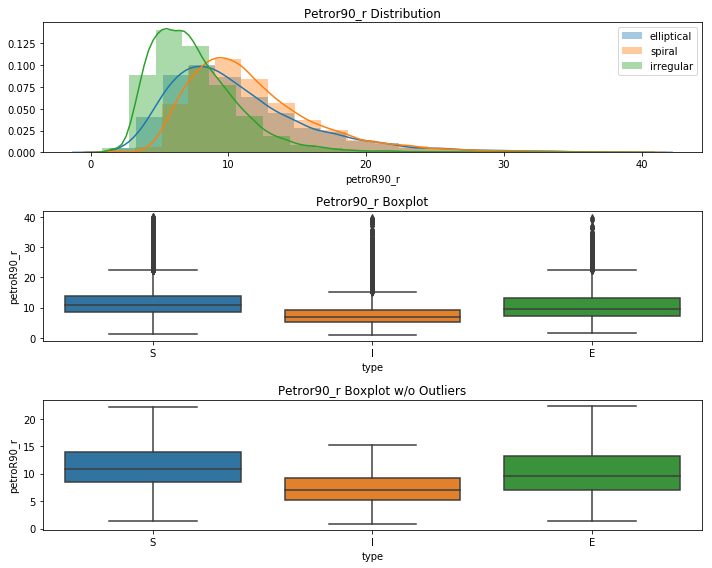

In [28]:
mask_petro = data_cl["petroR90_r"]<40
data_cl_petro = data_cl[mask_petro]
exploratory_plots(data_cl_petro, "petroR90_r")

In [29]:
data_cl_petro = data_cl[data_cl["petroR90_r"]<40]

In [30]:
print(data_cl.shape)
print(data_cl_petro.shape)

(57681, 14)
(57428, 14)


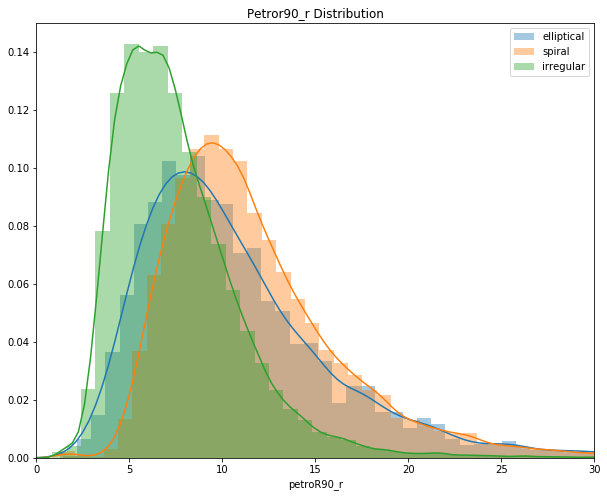

In [31]:
distribution_per_type(data_cl_petro, col_name="petroR90_r", bins=50)
_ = plt.xlim([0, 30])


### Ra

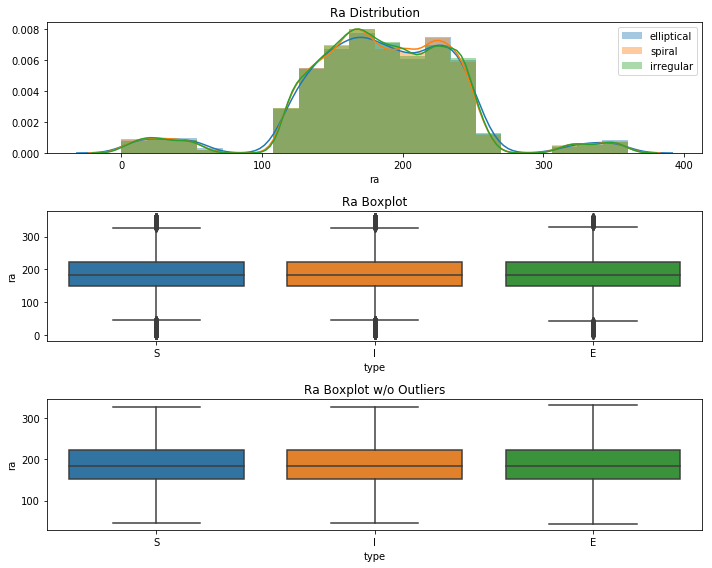

In [32]:
exploratory_plots(data_cl, "ra")

### Mag Distributions

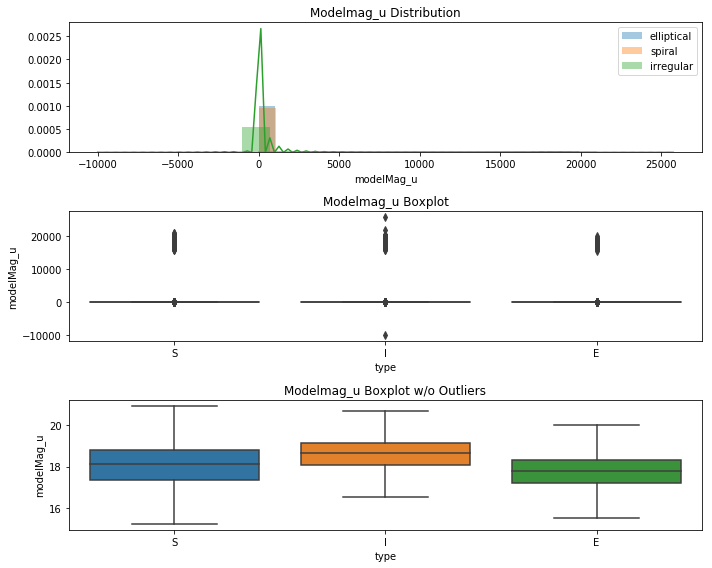

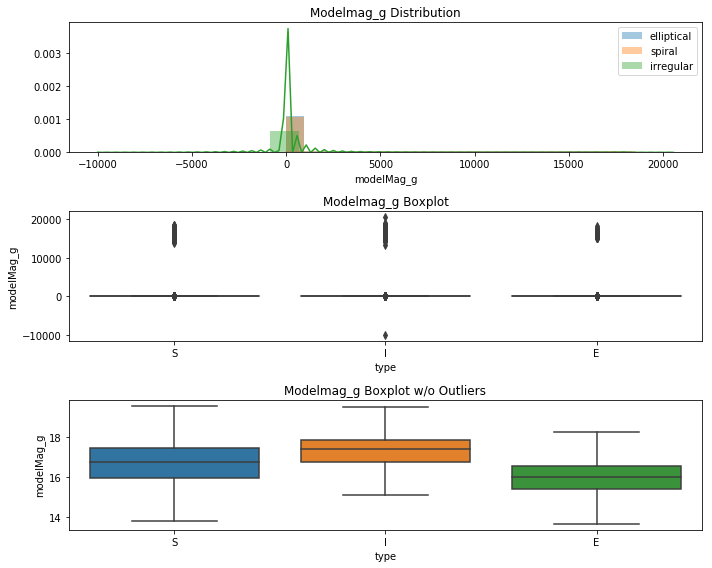

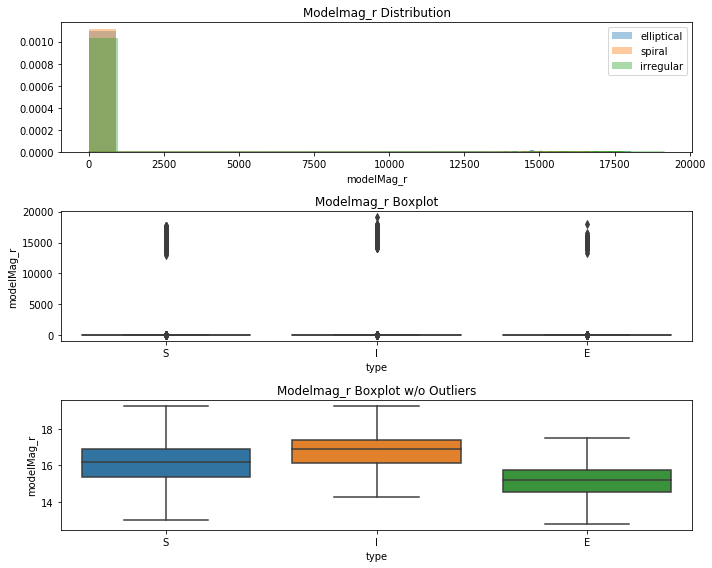

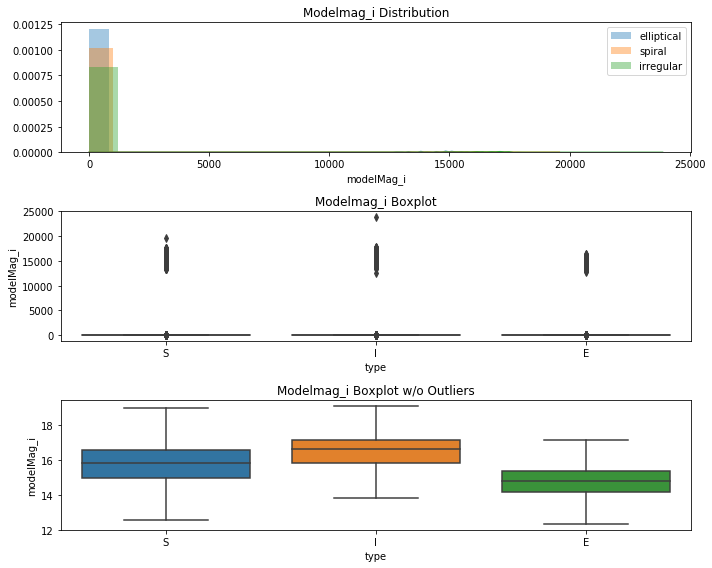

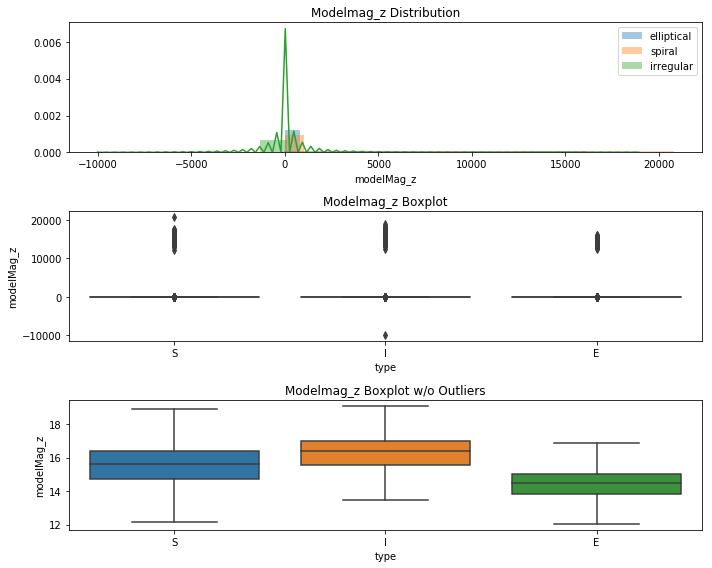

In [33]:
for mag in ['modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i','modelMag_z']:
    plt.figure()
    exploratory_plots(data_cl, mag)

In [34]:
mask_mag = ((abs(data_cl["modelMag_u"]) < 30) & 
    (abs(data_cl["modelMag_g"] < 30)) & 
    (abs(data_cl["modelMag_r"] < 30)) & 
    (abs(data_cl["modelMag_i"] < 30)) & 
    (abs(data_cl["modelMag_z"] < 30))) 
data_cl_mag = data_cl[mask_mag]
data_cl_mag.shape

(55164, 14)

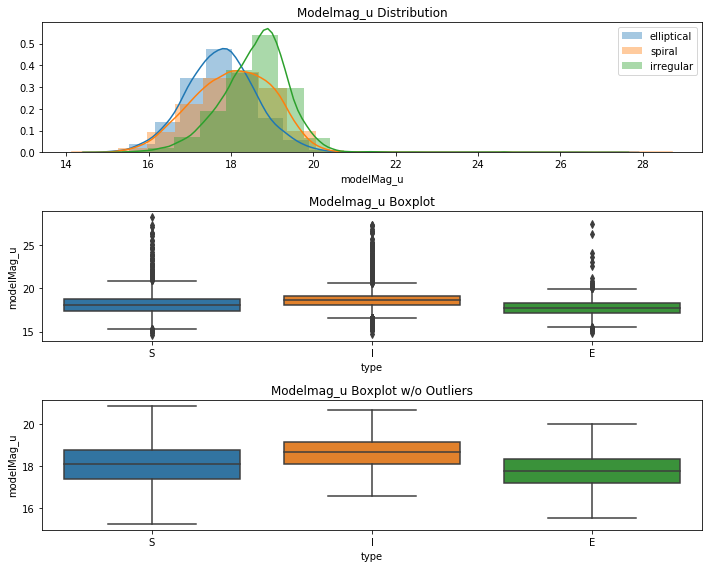

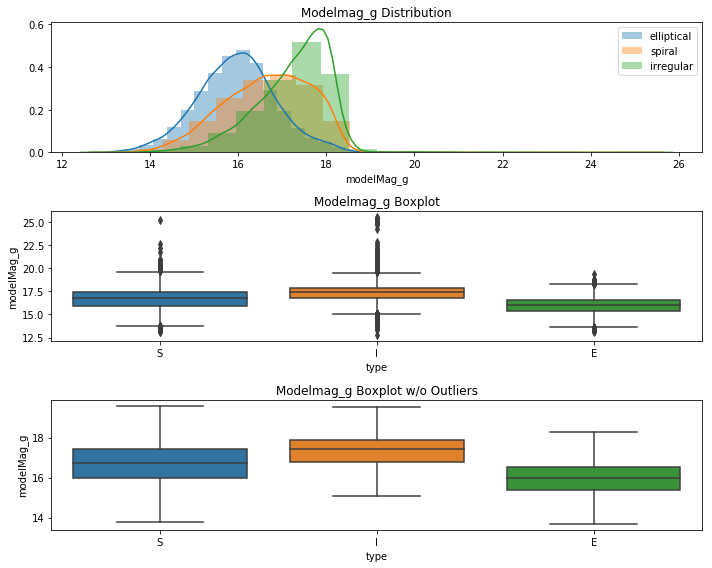

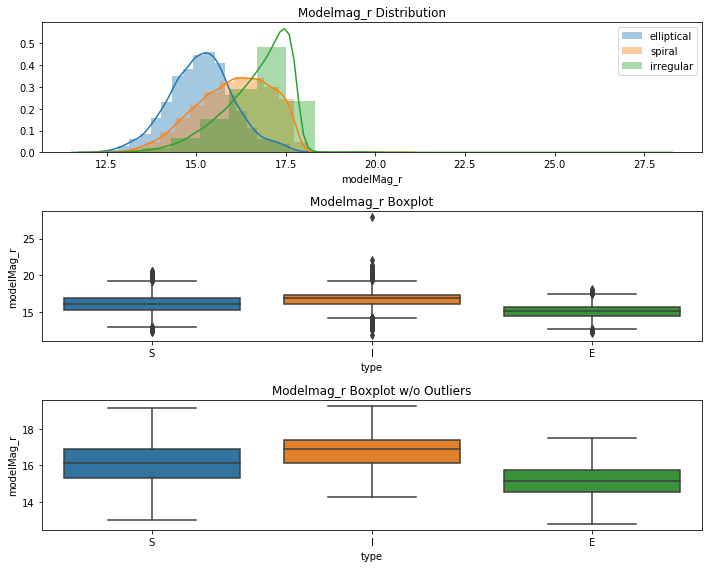

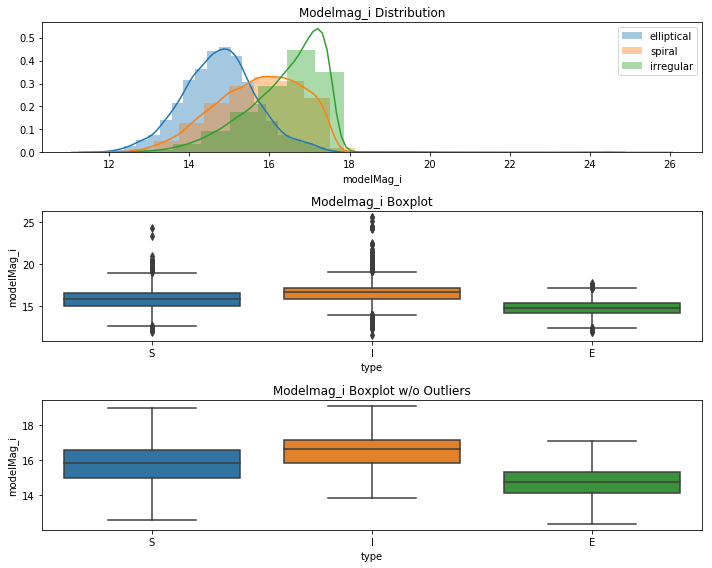

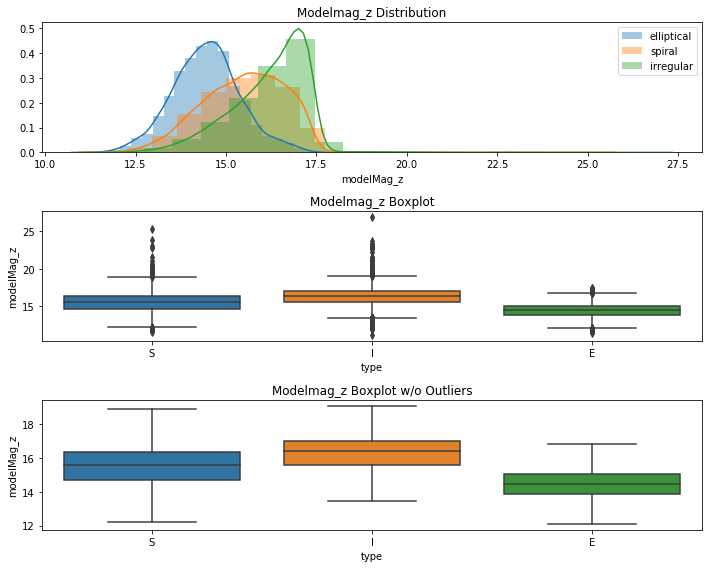

In [35]:
for mag in ['modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i','modelMag_z']:
    plt.figure()
    exploratory_plots(data_cl_mag, mag)

In [36]:
mask_no_outl = mask_color & mask_petro & mask_mag
data_cl_no_outl = data_cl[mask_no_outl]
print(data_cl.shape)
print(data_cl_no_outl.shape)
print(data_cl_no_outl.shape[0]/data_cl.shape[0]*100)

(57681, 14)
(54764, 14)
94.94287547025884


Sacando los outliers, solo estoy descartando ~3000 de un total de ~57000. Aun no tengo el 95% de los datos. Por lo tanto acepto el descarte de esots datos

In [37]:
data_cl_no_outl.head()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain,type
objID,,,,,,,,,,,,,,
"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0,S
"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1,I
"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1,I
"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1,I
"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1,I


#### Elimino dataframes que no voy a seguir usando

In [38]:
del data_cl_color
del data_cl_mag
del data_cl_petro

In [39]:
def num_type(row):
    if row["type"] == "I":
        return 1
    elif row["type"] == "S":
        return 2
    else:
        return 3
data_cl_no_outl["type_n"] = data_cl_no_outl.apply(num_type,axis=1)
data_cl["type_n"] = data_cl.apply(num_type,axis=1)

/home/franco/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/franco/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


# Componentes Principales 

Ajuste el modelo de CPA  al dataset con n=3 el número de componentes principales. Grafique.

In [40]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline

In [41]:
std_pipe = Pipeline([
        ("std_scaler", StandardScaler()),
        ("pca", PCA(n_components=3))
        ])
minmax_pipe = Pipeline([
        ("minmax_scaler", MinMaxScaler()),
        ("pca", PCA(n_components=3))
        ])
no_scaler_pipe = Pipeline([
        ("pca", PCA(n_components=3))
        ])

## Analisis del dataset sin outliers

In [89]:
data_cl_no_outl.columns

Index(['ra', 'dec', 'modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i',
       'modelMag_z', 'petroR90_r', 'z', 'Color', 'elliptical', 'spiral',
       'uncertain', 'type', 'type_n'],
      dtype='object')

In [108]:
drop_cols = ["ra", "dec","type", "elliptical", "spiral", "uncertain", "type_n"]
pca_minmax = minmax_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_std = std_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_no_scaler = no_scaler_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))

print("Explained Variance")
print("With MinMaxScaler: ", minmax_pipe["pca"].explained_variance_ratio_, sum(minmax_pipe["pca"].explained_variance_ratio_))
print("With StandardScaler: ", std_pipe["pca"].explained_variance_ratio_, sum(std_pipe["pca"].explained_variance_ratio_))
print("Without Scaler: ", no_scaler_pipe["pca"].explained_variance_ratio_, sum(no_scaler_pipe["pca"].explained_variance_ratio_))

Explained Variance
With MinMaxScaler:  [0.57595182 0.31372721 0.0670464 ] 0.9567254350250312
With StandardScaler:  [0.68143886 0.16499248 0.09048846] 0.9369198013255676
Without Scaler:  [0.88320685 0.09975914 0.01567041] 0.9986364003902178


In [109]:
minmax_pipe.steps[1]

('pca',
 PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
     svd_solver='auto', tol=0.0, whiten=False))

## Analisis del dataset con outliers

In [110]:
drop_cols = ["type", "elliptical", "spiral", "uncertain", "type_n"]
pca_minmax2 = minmax_pipe.fit_transform(data_cl.drop(drop_cols, axis=1))
pca_std2 = std_pipe.fit_transform(data_cl.drop(drop_cols, axis=1))
pca_no_scaler2 = no_scaler_pipe.fit_transform(data_cl.drop(drop_cols, axis=1))

print("Explained Variance")
print("With MinMaxScaler: ", minmax_pipe["pca"].explained_variance_ratio_, sum(minmax_pipe["pca"].explained_variance_ratio_))
print("With StandardScaler: ", std_pipe["pca"].explained_variance_ratio_, sum(std_pipe["pca"].explained_variance_ratio_))
print("Without Scaler: ", no_scaler_pipe["pca"].explained_variance_ratio_, sum(no_scaler_pipe["pca"].explained_variance_ratio_))

Explained Variance
With MinMaxScaler:  [0.455263   0.297038   0.14476633] 0.8970673405378018
With StandardScaler:  [0.10517764 0.1033385  0.10215372] 0.3106698640117776
Without Scaler:  [0.22834969 0.19997132 0.18679332] 0.6151143293617022


Vemos que dejando outliers que estan muy fuera del rango de intenres, empeora el PCA ya que las componentes principales ya no explican tanto la varianza de los datos

## Graficos 3D

Aprovechando los diferentes PCA que tenemos, vamos a ver si gráficando en 3 dimensiones, podemos ver grupos o patrones en algunas de las variables

In [140]:
def plot_3d(pca, df, colname=""):
    from mpl_toolkits.mplot3d import Axes3D 
    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111, projection='3d')
    im = ax.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
           c=df[colname].head(10000),cmap=plt.get_cmap("jet"),
          alpha=0.5)
    ax.set_xlabel("First Principal Component")
    ax.set_ylabel("Second Principal Component")
    ax.set_zlabel("Thrid Principal Component")
    fig.colorbar(im, ax=ax)


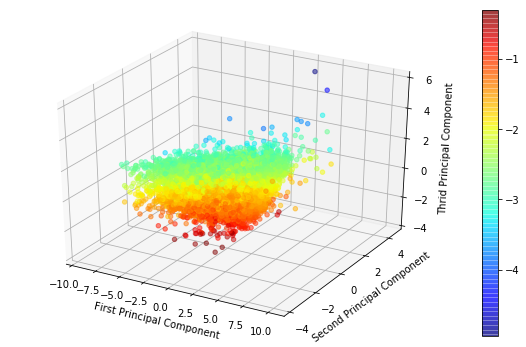

In [141]:
plot_3d(pca_std, data_cl_no_outl, colname="Color")

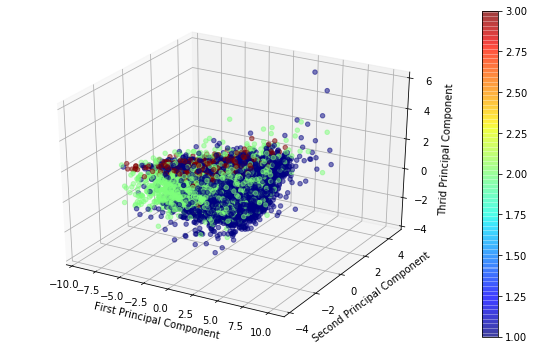

In [142]:
plot_3d(pca_std, data_cl_no_outl, colname="type_n")

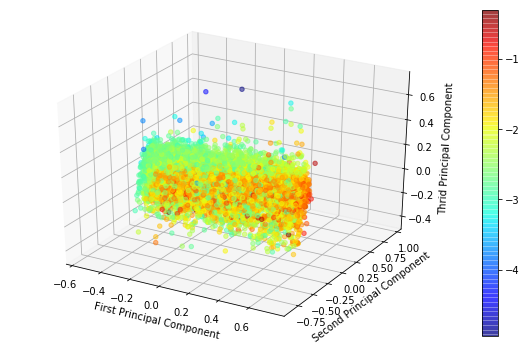

In [143]:
plot_3d(pca_minmax, data_cl_no_outl, colname="Color")

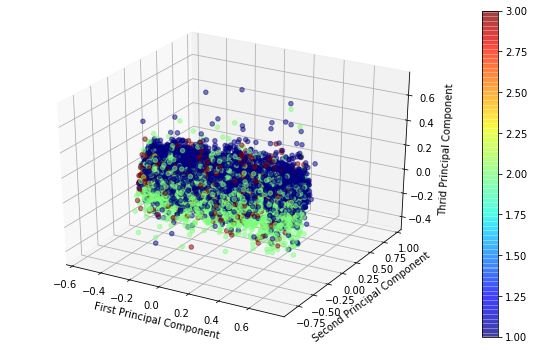

In [144]:
plot_3d(pca_minmax, data_cl_no_outl, colname="type_n")

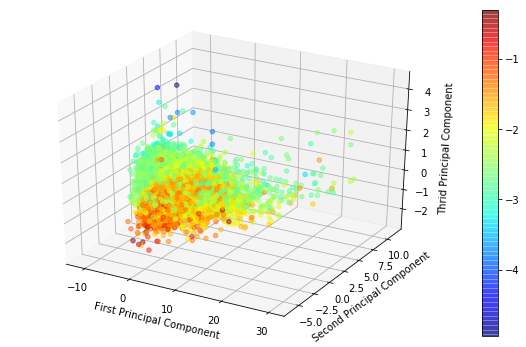

In [115]:
plot_3d(pca_no_scaler, data_cl_no_outl, colname="Color")

## Con todas las columnas

In [133]:
drop_cols = ["ra", "dec", "type","type_n"]
pca_std3 = std_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_minmax3 = minmax_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_no_scaler3 = no_scaler_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))

print("Explained Variance")
print("With MinMaxScaler: ", minmax_pipe["pca"].explained_variance_ratio_, sum(minmax_pipe["pca"].explained_variance_ratio_))
print("With StandardScaler: ", std_pipe["pca"].explained_variance_ratio_, sum(std_pipe["pca"].explained_variance_ratio_))
print("Without Scaler: ", no_scaler_pipe["pca"].explained_variance_ratio_, sum(no_scaler_pipe["pca"].explained_variance_ratio_))

Explained Variance
With MinMaxScaler:  [0.64796072 0.15830937 0.12095705] 0.9272271379344538
With StandardScaler:  [0.53139011 0.15418719 0.12800454] 0.8135818500619386
Without Scaler:  [0.86892194 0.09821358 0.01560738] 0.982742905028212


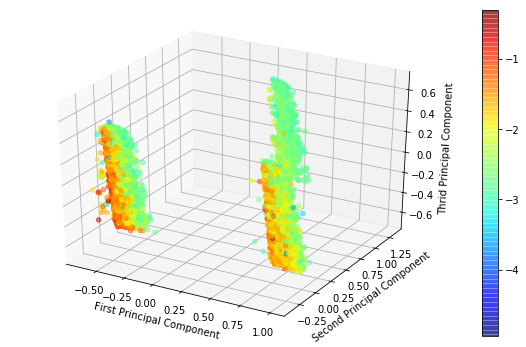

In [134]:
plot_3d(pca_minmax3, data_cl_no_outl, colname="Color")

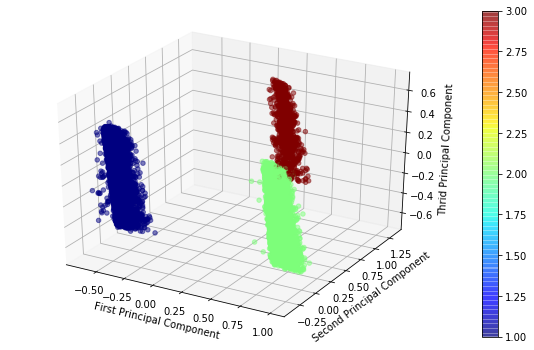

In [135]:
plot_3d(pca_minmax3, data_cl_no_outl, colname="type_n")

In [136]:
data_cl_no_outl.columns

Index(['ra', 'dec', 'modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i',
       'modelMag_z', 'petroR90_r', 'z', 'Color', 'elliptical', 'spiral',
       'uncertain', 'type', 'type_n'],
      dtype='object')

## Graficos 3D Interactivos

In [137]:
data_cl_no_outl.columns

Index(['ra', 'dec', 'modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i',
       'modelMag_z', 'petroR90_r', 'z', 'Color', 'elliptical', 'spiral',
       'uncertain', 'type', 'type_n'],
      dtype='object')

In [147]:
from plotly.offline import plot, init_notebook_mode, iplot
from plotly.graph_objs import *
import numpy as np
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()
# x = np.random.randn(2000)
# y = np.random.randn(2000)

# Instead of simply calling plot(...), store your plot as a variable and pass it to displayHTML().
# Make sure to specify output_type='div' as a keyword argument.
# (Note that if you call displayHTML() multiple times in the same cell, only the last will take effect.)

p = iplot([
    Scatter3d(x=pca_std[0:10000,0], y=pca_std[0:10000,1], z=pca_std[0:10000,2],
              mode='markers',
              marker=dict(color=data_cl_no_outl.reset_index().loc[0:10000, 'type_n'],
                          showscale=True,
                          colorscale='Bluered',
                          size=3
                          #cmap=plt.get_cmap("jet")
                         ))
  ],)


In [122]:
p = iplot([
    Scatter3d(x=pca_minmax3[0:10000,0], y=pca_minmax3[0:10000,1], z=pca_minmax3[0:10000,2],
              mode='markers',
              marker=dict(color=data_cl_no_outl.reset_index().loc[0:10000, 'type_n'],
                          showscale=True,
                          colorscale='Bluered',
                          size=3
                          #cmap=plt.get_cmap("jet")
                         ))
  ],)


# Clustering

Aplico modelos de clustering en el dataset, sin usar las columnas relacionadas a la morfologia de la galaxia para ver si alguno de los algoritmos puede encontrar ese patron de acuerdo 

In [123]:
#data["color_name"] = data["color"].apply(lambda row: "red" if row <-2.3 else "blue")

In [124]:
from sklearn.cluster import KMeans

In [125]:
rnd_state = 107

In [126]:
data_cl_no_outl.columns

Index(['ra', 'dec', 'modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i',
       'modelMag_z', 'petroR90_r', 'z', 'Color', 'elliptical', 'spiral',
       'uncertain', 'type', 'type_n'],
      dtype='object')

In [127]:
type_cols = ["ra", "dec", 'elliptical', 'spiral','uncertain', 'type', 'type_n']

In [128]:
kmean = KMeans(n_clusters=3, random_state=rnd_state)
cat_pred = kmean.fit_predict(data_cl_no_outl.drop(type_cols, axis=1))

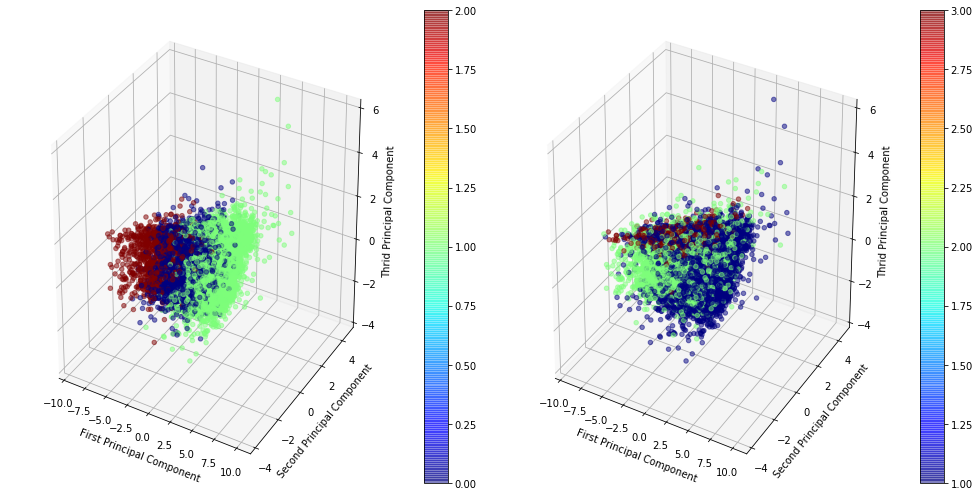

In [129]:
pca = pca_std
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121, projection='3d')
im = ax.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=cat_pred[0:10000],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax.set_xlabel("First Principal Component")
ax.set_ylabel("Second Principal Component")
ax.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax)

ax2 = fig.add_subplot(122, projection='3d')
im = ax2.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=data_cl_no_outl.head(10000)["type_n"],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax2.set_xlabel("First Principal Component")
ax2.set_ylabel("Second Principal Component")
ax2.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax2)

plt.tight_layout()

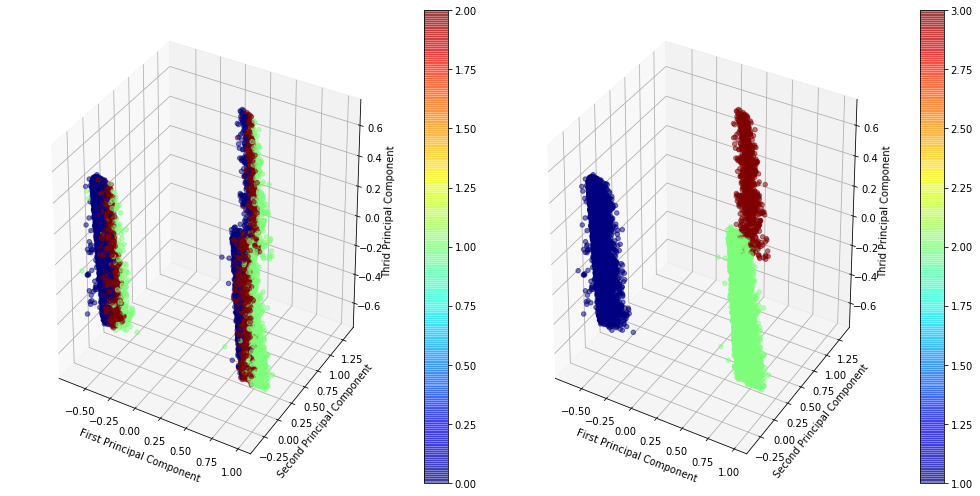

In [130]:
# Gaussian Mix CLustering
from sklearn.mixture import GaussianMixture
model = GaussianMixture(n_components=3, covariance_type="spherical", random_state=rnd_state)
cat_pred = model.fit_predict(data_cl_no_outl.drop(type_cols, axis=1))


# Plotting
pca = pca_minmax3
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121, projection='3d')
im = ax.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=cat_pred[0:10000],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax.set_xlabel("First Principal Component")
ax.set_ylabel("Second Principal Component")
ax.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax)

ax2 = fig.add_subplot(122, projection='3d')
im = ax2.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=data_cl_no_outl.head(10000)["type_n"],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax2.set_xlabel("First Principal Component")
ax2.set_ylabel("Second Principal Component")
ax2.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax2)

plt.tight_layout()

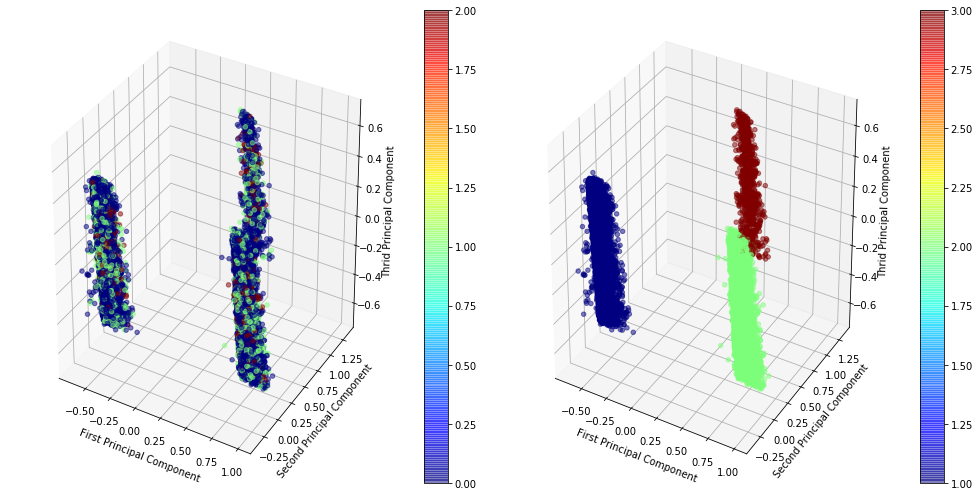

In [148]:
# Gaussian Mix CLustering
from sklearn.mixture import GaussianMixture
model = KMeans(n_clusters=3, random_state=rnd_state)
cat_pred = model.fit_predict(data_cl_no_outl.drop("type",axis=1))

# Plotting
pca = pca_minmax3
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121, projection='3d')
im = ax.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=cat_pred[0:10000],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax.set_xlabel("First Principal Component")
ax.set_ylabel("Second Principal Component")
ax.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax)

ax2 = fig.add_subplot(122, projection='3d')
im = ax2.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=data_cl_no_outl.head(10000)["type_n"],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax2.set_xlabel("First Principal Component")
ax2.set_ylabel("Second Principal Component")
ax2.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax2)

plt.tight_layout()

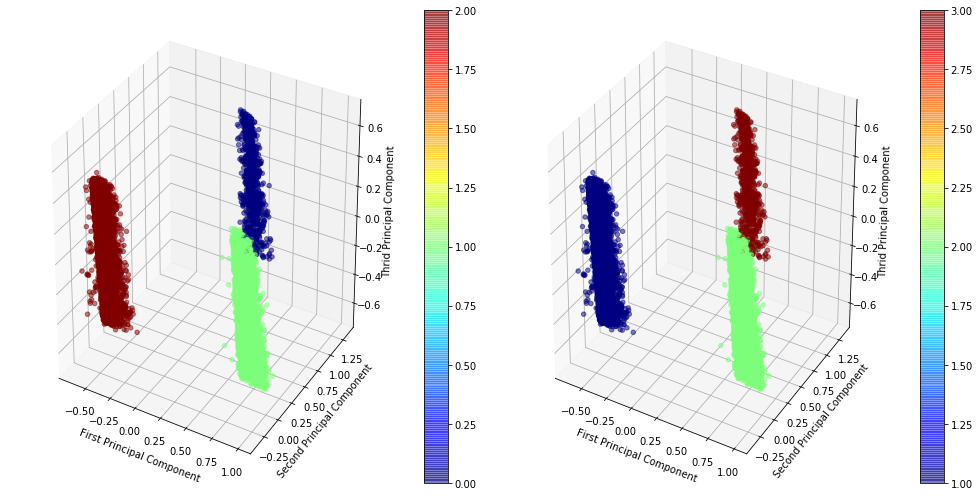

In [149]:
model = KMeans(n_clusters=3, random_state=rnd_state)
cat_pred = model.fit_predict(pca_minmax3)

# Plotting
pca = pca_minmax3
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121, projection='3d')
im = ax.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=cat_pred[0:10000],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax.set_xlabel("First Principal Component")
ax.set_ylabel("Second Principal Component")
ax.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax)

ax2 = fig.add_subplot(122, projection='3d')
im = ax2.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
       c=data_cl_no_outl.head(10000)["type_n"],cmap=plt.get_cmap("jet"),
      alpha=0.5)
ax2.set_xlabel("First Principal Component")
ax2.set_ylabel("Second Principal Component")
ax2.set_zlabel("Thrid Principal Component")
fig.colorbar(im, ax=ax2)

plt.tight_layout()

# Docker 

- Declare las versiones exactas de los sofwares usados. 
- Comparta una imagen para poder correr esta notebook.